In [1]:
from gdal import gdalconst
from sklearn import mixture
from sklearn.neighbors import KDTree
import itertools
import pickle

preprocessing the data, convert all historical reconstruction data into the same shape as 500-m Lidar data

In [5]:
def reproject_reconstruction(src_fn, match_fn, dst_fn, lidar=False):
    src_filename = src_fn
    src = gdal.Open(src_filename, gdalconst.GA_ReadOnly)
    src_proj = src.GetProjection()
    src_geotrans = src.GetGeoTransform()
    
    # We want a section of source that matches this:
    match_filename = match_fn
    match_ds = gdal.Open(match_filename, gdalconst.GA_ReadOnly)
    match_proj = match_ds.GetProjection()
    match_geotrans = match_ds.GetGeoTransform()
    wide = match_ds.RasterXSize
    high = match_ds.RasterYSize
    
    # Output / destination
    dst_filename = dst_fn
    dst = gdal.GetDriverByName('GTiff').Create(dst_filename, wide, high, 1, gdalconst.GDT_Float32)
    dst.SetGeoTransform( match_geotrans )
    dst.SetProjection( match_proj)
    if not lidar:
        gdal.ReprojectImage(src, dst, src_proj, match_proj, gdalconst.GRA_Bilinear)
    else:
        gdal.ReprojectImage(src, dst, src_proj, match_proj, gdalconst.GRA_Average)
    del dst

In [14]:
def reproject_all_merced_recon():
    year_list = range(2001, 2015)
    match_fn = "ASO_Lidar/Merced_500m_DEM.tif"
    for temp_year in year_list:
        print temp_year
        temp_date = date(temp_year, 3, 1)
        end_date = date(temp_year, 8, 31)
        while temp_date <= end_date:
            src_fn = str(temp_year) + "/" + temp_date.strftime("%d%b%Y").upper() + ".tif"
            dst_fn = "MB_recon/" + temp_date.strftime("%d%b%Y").upper() + ".tif"
            reproject_reconstruction(src_fn, match_fn, dst_fn)
            temp_date += timedelta(days=1)

In [15]:
def reproject_all_tuolumne_recon():
    year_list = range(2001, 2015)
    match_fn = "ASO_Lidar/Tuolumne_500m_DEM.tif"
    for temp_year in year_list:
        print temp_year
        temp_date = date(temp_year, 3, 1)
        end_date = date(temp_year, 8, 31)
        while temp_date <= end_date:
            src_fn = str(temp_year) + "/" + temp_date.strftime("%d%b%Y").upper() + ".tif"
            dst_fn = "TB_recon/" + temp_date.strftime("%d%b%Y").upper() + ".tif"
            reproject_reconstruction(src_fn, match_fn, dst_fn)
            temp_date += timedelta(days=1)

The idea here is to find representative 20-ish pixels of the basin using either k-means or Gaussian-mixture model. And use them to run kNN's in the real-time interpolation scheme

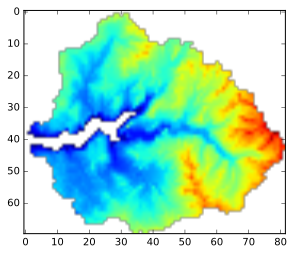

In [3]:
mb_dem = gdal.Open("ASO_Lidar/Merced_500m_DEM.tif").ReadAsArray()
mb_dem[mb_dem <= 1500.] = np.nan
plt.imshow(mb_dem)

GMM tuning

tied
diag
full


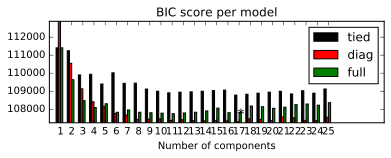

In [4]:
lowest_bic = np.infty
bic = []

mb_dem = gdal.Open("ASO_Lidar/Merced_500m_DEM.tif").ReadAsArray()
mb_dem[mb_dem <= 1500.] = np.nan
xgrid, ygrid = np.meshgrid(np.arange(0, len(mb_dem[0]), 1), np.arange(0, len(mb_dem), 1))
mb_slope = gdal.Open("ASO_Lidar/Merced_500m_SLP.tif").ReadAsArray()
mb_aspect = gdal.Open("ASO_Lidar/Merced_500m_ASP.tif").ReadAsArray()
mb_veg = gdal.Open("ASO_Lidar/Merced_500m_VEG.tif").ReadAsArray()
GMM_feature = np.column_stack((np.column_stack((np.column_stack((mb_dem.flatten(), mb_slope.flatten())), mb_aspect.flatten())), mb_veg.flatten()))
GMM_feature = GMM_feature[np.isfinite(GMM_feature[:, 0])]
n_components_range = range(1, 26)
cv_types = ['tied', 'diag', 'full']
X = np.copy(GMM_feature)
for cv in cv_types:
    print cv
    for n_components in n_components_range:
        gmm = mixture.GMM(n_components=n_components, covariance_type=cv)
        gmm.fit(X)
        bic.append(gmm.bic(X))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['k', 'r', 'g', 'b', 'c', 'm', 'y'])
clf = best_gmm
bars = []

# Plot the BIC scores
spl = plt.subplot(2, 1, 1)
for i, (cv, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types)

[[  2.85820996e+03   3.39601684e+00   2.40819351e+02   7.98965394e-02]
 [  2.89182544e+03   2.92453575e+00   1.72872543e+02   4.89654206e-02]
 [  2.87791162e+03   6.89567089e+00   1.97000183e+02   5.80711439e-02]
 ..., 
 [  2.84256226e+03   2.56473112e+00   3.53358246e+02   0.00000000e+00]
 [  2.81711499e+03   1.22847557e+00   2.79810944e+02   0.00000000e+00]
 [  2.88861719e+03   5.41483307e+00   3.35542542e+02   0.00000000e+00]]
[ 3 12 12 ...,  3  3  3]
(array([25, 20, 14, 23, 37, 55, 62, 52, 45, 32, 34, 39, 50, 49, 60]), array([34, 16, 26, 60, 56, 36, 50, 12, 20, 10, 27, 64, 57, 66, 15]))


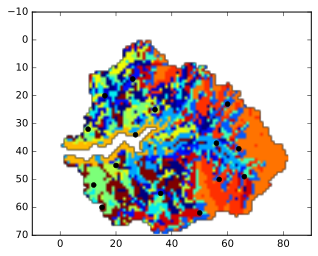

In [5]:
mb_dem = gdal.Open("ASO_Lidar/Merced_500m_DEM.tif").ReadAsArray()
mb_dem[mb_dem <= 1500.] = np.nan
xgrid, ygrid = np.meshgrid(np.arange(0, len(mb_dem[0]), 1), np.arange(0, len(mb_dem), 1))
mb_slope = gdal.Open("ASO_Lidar/Merced_500m_SLP.tif").ReadAsArray()
mb_aspect = gdal.Open("ASO_Lidar/Merced_500m_ASP.tif").ReadAsArray()
mb_veg = gdal.Open("ASO_Lidar/Merced_500m_VEG.tif").ReadAsArray()
GMM_feature = np.column_stack((np.column_stack((np.column_stack((mb_dem.flatten(), mb_slope.flatten())), mb_aspect.flatten())), mb_veg.flatten()))
GMM_feature_idx = np.where(np.isfinite(GMM_feature[:, 0]))
GMM_feature_finite = GMM_feature[GMM_feature_idx]
X = GMM_feature_finite
print X
class_image = np.zeros(len(GMM_feature))
class_image[np.isnan(GMM_feature[:, 0])] = np.nan

gmm = mixture.GMM(n_components=15, covariance_type='full')
labels = gmm.fit_predict(X)

class_image[GMM_feature_idx] = labels
class_image = np.reshape(class_image, mb_dem.shape)
plt.imshow(class_image)
print labels

# Loop through labels to get the centroid of each cluster and find the nearest neighbor in 2D space
unique_labels = np.unique(labels)
x_idx_list = []
y_idx_list = []
for label in unique_labels:
#     print label
    temp_labels_idx = np.where(labels==label)
    X_label = X[labels==label]
    X_label_KDTree = KDTree(X_label)
    X_label_median = np.nanmean(X_label, axis=0)
    dist, idx = X_label_KDTree.query(np.array([X_label_median]))
    X_label_median_idx = temp_labels_idx[0][idx]
    GMM_feature_median_label_idx = GMM_feature_idx[0][X_label_median_idx]
    x_idx = xgrid.flatten()[GMM_feature_median_label_idx]
    y_idx = ygrid.flatten()[GMM_feature_median_label_idx]
    x_idx_list.append(x_idx[0][0])
    y_idx_list.append(y_idx[0][0])
plt.imshow(class_image)
plt.plot(x_idx_list, y_idx_list, '.k', markersize=10)

sensor_idx = (np.array(y_idx_list), np.array(x_idx_list))
print sensor_idx

Get time series from historical reconstruction data

In [6]:
year_range = range(2001, 2014)
historical_fn_list = []
recon_ts = None
for year in year_range:
    temp_date = date(year, 3, 1)
    ending_date = date(year, 8, 31)
    while temp_date <= ending_date:
        temp_fn = "MB_recon/" + temp_date.strftime("%d%b%Y").upper() + ".tif"
        historical_fn_list.append(temp_fn)
        temp_recon = gdal.Open(temp_fn).ReadAsArray()
        temp_date += timedelta(days=1)
        if recon_ts is None:
            recon_ts = temp_recon[sensor_idx]
        else:
            recon_ts = np.vstack((recon_ts, temp_recon[sensor_idx]))
pickle.dump(historical_fn_list, open("library_mb_2001_2013_filenames.p", 'wb'))
np.save("library_mb_2001_2013.npy", recon_ts)

In [7]:
date_list = [date(2014, 3, 24), date(2014, 4, 6), date(2014, 4, 14), date(2014, 4, 23), date(2014, 4, 29), date(2014, 5, 3), date(2014, 5, 12)]
sensor_data = None
for temp_date in date_list:
    lidar_fn = "ASO_Lidar/MB" + temp_date.strftime("%Y%m%d") + "_500m.tif"
    lidar_swe = gdal.Open(lidar_fn).ReadAsArray() * 0.3333
    if sensor_data is None:
        sensor_data = lidar_swe[sensor_idx]
    else:
        sensor_data = np.vstack((sensor_data, lidar_swe[sensor_idx]))
np.save("aso_simulated_sensor_data.npy", sensor_data)

In [12]:
recon_ts = np.load("library_mb_2001_2013.npy")
recon_fn = pickle.load(open("library_mb_2001_2013_filenames.p", "rb"))
lidar_sensor_data = np.load("aso_simulated_sensor_data.npy")
kNN = KDTree(recon_ts)
k = 30
fig, axarr = plt.subplots(ncols=2, nrows=7, figsize=(3.5, 10))
for j, (sensor, temp_date) in enumerate(zip(lidar_sensor_data, date_list)):
    print j
    dist, idx = kNN.query(np.array([sensor]), k=k)
    temp_fn_list = [recon_fn[i] for i in idx[0]]
    kNN_map_sum = 0.
    for temp_fn in temp_fn_list:
        kNN_map_sum += gdal.Open(temp_fn).ReadAsArray()
    kNN_map_avg = kNN_map_sum / float(k)
    lidar_map = gdal.Open("ASO_Lidar/MB"+temp_date.strftime("%Y%m%d") + "_500m.tif").ReadAsArray() * 0.3333
    recon_map = gdal.Open("MB_recon/"+temp_date.strftime("%d%b%Y").upper()+".tif").ReadAsArray()
    kNN_map_avg_valid = kNN_map_avg[lidar_map >= 0.]
    lidar_map_valid = lidar_map[lidar_map >= 0.]
    recon_map_valid = recon_map[lidar_map >= 0.]
    
    axarr[j, 0].plot(lidar_map_valid, kNN_map_avg_valid, '.k', markersize=2)
    axarr[j, 0].plot([0, 1], [0, 1], '--k')
    axarr[j, 0].set_xlim([0, 1])
    axarr[j, 0].set_ylim([0, 1])
    axarr[j, 1].plot(lidar_map_valid, recon_map_valid, '.k', markersize=2)
    axarr[j, 1].plot([0, 1], [0, 1], '--k')
    axarr[j, 1].set_xlim([0, 1])
    axarr[j, 1].set_ylim([0, 1])
    if j < 6:
        axarr[j, 0].xaxis.set_ticklabels([])
        axarr[j, 1].xaxis.set_ticklabels([])
        axarr[j, 0].yaxis.set_ticklabels(["", "0.2", "0.4", "0.6", "0.8", "1.0"])
    axarr[j, 1].yaxis.set_ticklabels([])
    if j==6:
        axarr[j, 1].xaxis.set_ticklabels(["", "0.2", "0.4", "0.6", "0.8", "1.0"])
fig.text(0.2, 0.08, 'Lidar measurements, m')
fig.text(0.008, 0.6, 'kNN interpolation, m', rotation=90)
fig.text(0.923, 0.65, 'Reconstruction at the same date as Lidar scanning, m', rotation=270)
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

0
1
2
3
4
5
6
